In [122]:
import os
import sys
from pathlib import Path

filepath = os.path.abspath('../')
sys.path.append(str(Path(filepath) / "src"))

import detInvModel as dim
import pandas as pd
pd.set_option("plotting.backend","plotly")
import savedRes as sr

In [123]:
time_data = {
    'start_date': pd.Timestamp(year=2019, month=1, day=1),
    'end_date': pd.Timestamp(year=2020, month=1, day=1),
    'ref_date': pd.Timestamp(year=2019, month=1, day=1)}
dirs = {
    'data_dir': "data\\",
    'ctrl_data_file': 'ctrl_data.csv',
    'res_dir': 'results\\'}

In [124]:
obj = dim.deterministicModel(time_data, dirs)

0 load Series/load_series.csv
data\Series/load_series.csv
1 wind Series/pot_wind_profiles.csv
data\Series/pot_wind_profiles.csv
2 inst_wind Series/inst_wind_profiles.csv
data\Series/inst_wind_profiles.csv
4 solar Series/solar_profiles.csv
data\Series/solar_profiles.csv
5 offshore_wind Series/offshore_wind_series.csv
data\Series/offshore_wind_series.csv
6 inflow Series/inflow.csv
data\Series/inflow.csv
7 inflow_ureg Series/inflow_ureg.csv
data\Series/inflow_ureg.csv
8 import_price Series/import_price_utc.csv
data\Series/import_price_utc.csv
9 export_price Series/export_price_utc.csv
data\Series/export_price_utc.csv


In [125]:
res = sr.savedRes(dirs['res_dir'], data=obj.data)

In [126]:
res.plotValue("prod")

In [127]:
res.plotValue("cur")

In [128]:
res.plotValue("rat")

No values found!


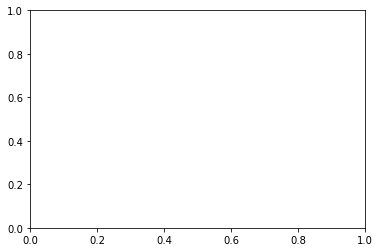

In [129]:
res.plotInvByType()

In [130]:
objects=None
plotType='bar'
subplots=False
lower_lim=0.0

objects = res.getObjects(objects, default=res.POWER_PLANTS)
inv_by_type = res.getInvByType(objects=objects, lower_lim=lower_lim)

In [131]:
inv_by_type

,Init_power,new_power,retired_cap
index,,,


In [132]:
[k + ": " + str(v) for (k, v) in res.inv_res["new_power"].items() if v != 0]

['BS01: 867.5071826024158',
 'BS04: 1074.557458428596',
 'BS05: 2775.78678876212',
 'BS06: 558.1335443056155',
 'BS08: 2626.242569688086']

In [133]:
res.getInvByType()

,Init_power,new_power,retired_cap
index,,,
Battery,0.00,7902.227544,0.0
Biomass,0.00,0.000000,0.0
CC Gas,0.00,0.000000,0.0
CC H2,0.00,0.000000,0.0
CCS Coal,0.00,0.000000,0.0
CCS Gas,0.00,0.000000,0.0
CT Gas,0.00,0.000000,0.0
CT H2,0.00,0.000000,0.0
Coal,0.00,0.000000,0.0


In [134]:
res.getValue("from_storage")

plant,BS01,BS04,BS05,BS06,BS08,HP01,HP03,HP04,HP05,HP06,HP07,HP08
,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage,from_storage
2019-01-01 00:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0
2019-01-01 01:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,11.335570,0.0
2019-01-01 02:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0
2019-01-01 03:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0
2019-01-01 04:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0
2019-12-31 20:00:00,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0000,0.0,0.0,0.0,27.537279,0.0
2019-12-31 21:00:00,0.00000,0.000000,0.0,0.0,316.914982,0.0,0.0000,0.0,0.0,0.0,0.000000,0.0


In [135]:
obj.data.inst_wind_series

,1,2,3,8
timestamp,,,,
2019-01-01 00:00:00,63.293721,0.524761,124.168451,589.780210
2019-01-01 01:00:00,47.566058,0.507730,93.376454,572.306321
2019-01-01 02:00:00,49.591025,0.504537,80.537191,515.425915
2019-01-01 03:00:00,49.814184,0.502408,44.909628,511.437049
2019-01-01 04:00:00,48.847159,0.485377,39.295924,447.998297
...,...,...,...,...
2019-12-31 19:00:00,8.685041,0.191064,74.645582,113.084482
2019-12-31 20:00:00,10.057886,0.237579,84.650202,111.641486
2019-12-31 21:00:00,9.859522,0.334336,81.204166,84.534632


In [136]:
obj.data.inflow_series

,3,4,5,6,7,8
Timestamp,,,,,,
2019-01-01 00:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 01:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 02:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 03:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 04:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
...,...,...,...,...,...,...
2019-12-31 19:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036
2019-12-31 20:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036
2019-12-31 21:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036


In [137]:
res.plotValue("storage")

In [138]:
res.inv_line

,new_branch,MaxCap,From,To,Cap,geometry
0,0.000000,1,EN01,EN02,1.000000,"LINESTRING (5.31450 59.31705, 4.88871 59.30678)"
1,0.000000,555,EN01,EN03,555.000000,"LINESTRING (5.31450 59.31705, 5.41349 59.78713)"
2,0.000000,555,EN03,EN04,555.000000,"LINESTRING (5.41349 59.78713, 6.01410 59.86369)"
3,0.000000,1111,EN01,EN05,1111.000000,"LINESTRING (5.31450 59.31705, 6.40997 59.66830)"
4,0.000000,555,EN04,EN05,555.000000,"LINESTRING (6.01410 59.86369, 6.40997 59.66830)"
5,0.000000,3517,EN05,EN06,3517.000000,"LINESTRING (6.40997 59.66830, 6.67202 59.48445)"
6,0.000000,555,EN06,EN07,555.000000,"LINESTRING (6.67202 59.48445, 6.54947 60.06761)"
7,0.000000,555,EN04,MN09,555.000000,"LINESTRING (6.01410 59.86369, 5.84294 60.38997)"
8,0.000000,4073,EN06,MN10,4073.000000,"LINESTRING (6.67202 59.48445, 7.29217 59.33964)"
9,0.000000,2036,EN06,EN08,2036.000000,"LINESTRING (6.67202 59.48445, 5.71358 58.82453)"


c:\Users\espenb\Miniconda3\lib\site-packages\geopandas\plotting.py:678: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



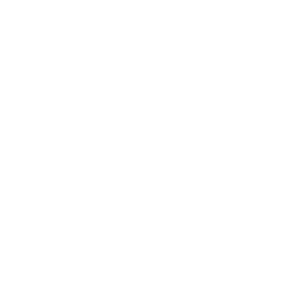

In [139]:
res.plotMap(nodes=res.H2_NODES, linetype="base", plot_shape=False, labels=False)

In [140]:
data = res.data

In [141]:
data.wind_series

,1,2,3,8
timestamp,,,,
2019-01-01 00:00:00,0.922649,0.437301,0.830003,1.084853
2019-01-01 01:00:00,0.693383,0.423109,0.624174,1.052711
2019-01-01 02:00:00,0.722901,0.420448,0.538350,0.948084
2019-01-01 03:00:00,0.726154,0.418674,0.300198,0.940747
2019-01-01 04:00:00,0.712058,0.404481,0.262673,0.824056
...,...,...,...,...
2019-12-31 19:00:00,0.126604,0.159220,0.498968,0.208010
2019-12-31 20:00:00,0.146616,0.197983,0.565844,0.205355
2019-12-31 21:00:00,0.143725,0.278613,0.542809,0.155495


In [142]:
data.inst_wind_series

,1,2,3,8
timestamp,,,,
2019-01-01 00:00:00,63.293721,0.524761,124.168451,589.780210
2019-01-01 01:00:00,47.566058,0.507730,93.376454,572.306321
2019-01-01 02:00:00,49.591025,0.504537,80.537191,515.425915
2019-01-01 03:00:00,49.814184,0.502408,44.909628,511.437049
2019-01-01 04:00:00,48.847159,0.485377,39.295924,447.998297
...,...,...,...,...
2019-12-31 19:00:00,8.685041,0.191064,74.645582,113.084482
2019-12-31 20:00:00,10.057886,0.237579,84.650202,111.641486
2019-12-31 21:00:00,9.859522,0.334336,81.204166,84.534632


In [143]:
data.offshore_wind_series

,1,2,3,4,5,6,7,8
timestamp,,,,,,,,
2019-01-01 00:00:00,0,0,0,0,0,0,0,0
2019-01-01 01:00:00,0,0,0,0,0,0,0,0
2019-01-01 02:00:00,0,0,0,0,0,0,0,0
2019-01-01 03:00:00,0,0,0,0,0,0,0,0
2019-01-01 04:00:00,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,0,0,0,0,0,0,0,0
2019-12-31 20:00:00,0,0,0,0,0,0,0,0
2019-12-31 21:00:00,0,0,0,0,0,0,0,0


In [144]:
res.detData['TYPE_TO_THERMAL_PLANTS']


{'CT Gas': ['CTG01',
  'CTG02',
  'CTG03',
  'CTG04',
  'CTG05',
  'CTG06',
  'CTG07',
  'CTG08',
  'CTG13'],
 'CC Gas': ['CCG01',
  'CCG02',
  'CCG03',
  'CCG04',
  'CCG05',
  'CCG06',
  'CCG07',
  'CCG08',
  'CCG13'],
 'CCS Gas': ['CCSG01',
  'CCSG02',
  'CCSG03',
  'CCSG04',
  'CCSG05',
  'CCSG06',
  'CCSG07',
  'CCSG08',
  'CCSG13'],
 'Coal': ['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C13'],
 'CCS Coal': ['CCSC01',
  'CCSC02',
  'CCSC03',
  'CCSC04',
  'CCSC05',
  'CCSC06',
  'CCSC07',
  'CCSC08',
  'CCSC13'],
 'Nuclear': ['N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N13'],
 'Biomass': ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B13'],
 'CC H2': ['CCH01',
  'CCH02',
  'CCH03',
  'CCH04',
  'CCH05',
  'CCH06',
  'CCH07',
  'CCH08',
  'CCH13'],
 'CT H2': ['CTH01',
  'CTH02',
  'CTH03',
  'CTH04',
  'CTH05',
  'CTH06',
  'CTH07',
  'CTH08',
  'CTH13'],
 'PEMFC': ['PEMFC01',
  'PEMFC02',
  'PEMFC03',
  'PEMFC04',
  'PEMFC05',
  'PEMFC06',
  'PEM

In [145]:
res.plotValue("exp")

In [146]:
res.plotValue("imp")

In [147]:
res.detData.keys()

dict_keys(['TIME', 'LAST_TIME', 'EL_NODES', 'H2_NODES', 'INTERNAL_NODES', 'MARKET_NODES', 'NODES', 'CURRENT_LINES', 'NEW_LINES', 'LINES', 'PIPES', 'BRANCHES', 'NEW_BRANCHES', 'BRANCHES_AT_NODE', 'PLANT_TYPES', 'POWER_PLANT_TYPES', 'THERMAL_PLANT_TYPES', 'HYDROGEN_PLANT_TYPES', 'STORAGE_TYPES', 'CONV_TYPES', 'GAS_PLANT_TYPES', 'SMR_PLANT_TYPES', 'type2prefix', 'TYPE_TO_PLANTS', 'TYPE_TO_THERMAL_PLANTS', 'TYPE_TO_CONV_PLANTS', 'PLANTS', 'ONSHORE_WIND_POWER_PLANTS', 'TYPE_TO_POWER_PLANTS', 'SOLAR_POWER_PLANTS', 'CT_GAS_POWER_PLANTS', 'CC_GAS_POWER_PLANTS', 'CCS_GAS_POWER_PLANTS', 'COAL_POWER_PLANTS', 'CCS_COAL_POWER_PLANTS', 'NUCLEAR_POWER_PLANTS', 'BIOMASS_POWER_PLANTS', 'OFFSHORE_WIND_POWER_PLANTS', 'SMR_PLANTS', 'TYPE_TO_H2_PLANTS', 'SMR_CCS_PLANTS', 'PEMEL_PLANTS', 'CC_H2_POWER_PLANTS', 'CT_H2_POWER_PLANTS', 'PEMFC_POWER_PLANTS', 'BATTERY_STORAGE', 'TYPE_TO_STORAGE', 'HYDROGEN_STORAGE', 'HYDRO_STORAGE', 'TYPE_TO_GEN_PLANTS', 'WIND_POWER_PLANTS', 'RENEWABLE_POWER_PLANTS', 'EL_STORAGE',

In [148]:
res.detData['Load']


{(0, 'EN01'): 689.440659391682,
 (0, 'EN02'): 0.35160926378304,
 (0, 'EN03'): 72.91781601464197,
 (0, 'EN04'): 193.3212775833993,
 (0, 'EN05'): 90.74308640900313,
 (0, 'EN06'): 20.301391283208623,
 (0, 'EN07'): 163.29456389522787,
 (0, 'EN08'): 529.764770223494,
 (1, 'EN01'): 683.4845437927577,
 (1, 'EN02'): 0.33625102855616,
 (1, 'EN03'): 70.33811244137696,
 (1, 'EN04'): 192.23180277199256,
 (1, 'EN05'): 90.4368815941672,
 (1, 'EN06'): 19.67890281166914,
 (1, 'EN07'): 162.44410161953937,
 (1, 'EN08'): 509.9032124611823,
 (2, 'EN01'): 680.9217259570304,
 (2, 'EN02'): 0.3296426344592,
 (2, 'EN03'): 69.22810874540322,
 (2, 'EN04'): 191.76301981573943,
 (2, 'EN05'): 90.30512673685908,
 (2, 'EN06'): 19.41105633842673,
 (2, 'EN07'): 162.07816179642023,
 (2, 'EN08'): 501.3571133076044,
 (3, 'EN01'): 681.2546942161839,
 (3, 'EN02'): 0.3305012149824,
 (3, 'EN03'): 69.37232344265948,
 (3, 'EN04'): 191.82392537160396,
 (3, 'EN05'): 90.32224468604036,
 (3, 'EN06'): 19.445855680257683,
 (3, 'EN07'

In [149]:
[print("%s: %s"%(k,v)) for (k, v ) in res.detData['Renewable_profile'].items() if "W" in k[1]]


(0, 'SW01'): 0.9226
(1, 'SW01'): 0.6934
(2, 'SW01'): 0.7229
(3, 'SW01'): 0.7262
(4, 'SW01'): 0.7121
(5, 'SW01'): 0.6786
(6, 'SW01'): 0.7052
(7, 'SW01'): 0.7521
(8, 'SW01'): 0.7356
(9, 'SW01'): 0.7405
(10, 'SW01'): 0.6341
(11, 'SW01'): 0.0
(12, 'SW01'): 0.0
(13, 'SW01'): 0.0
(14, 'SW01'): 0.0
(15, 'SW01'): 0.0
(16, 'SW01'): 0.0
(17, 'SW01'): 0.0
(18, 'SW01'): 0.0
(19, 'SW01'): 0.0
(20, 'SW01'): 0.0
(21, 'SW01'): 0.0
(22, 'SW01'): 0.0
(23, 'SW01'): 0.0
(24, 'SW01'): 0.0
(25, 'SW01'): 0.0
(26, 'SW01'): 0.0
(27, 'SW01'): 0.0
(28, 'SW01'): 0.0
(29, 'SW01'): 0.0
(30, 'SW01'): 0.0
(31, 'SW01'): 0.0
(32, 'SW01'): 0.0
(33, 'SW01'): 0.0
(34, 'SW01'): 0.0
(35, 'SW01'): 0.0
(36, 'SW01'): 0.0
(37, 'SW01'): 0.0
(38, 'SW01'): 0.0
(39, 'SW01'): 0.0
(40, 'SW01'): 0.0
(41, 'SW01'): 0.0
(42, 'SW01'): 0.0
(43, 'SW01'): 0.0
(44, 'SW01'): 0.0
(45, 'SW01'): 0.0
(46, 'SW01'): 0.0
(47, 'SW01'): 0.0
(48, 'SW01'): 0.0
(49, 'SW01'): 0.0
(50, 'SW01'): 0.0
(51, 'SW01'): 0.0
(52, 'SW01'): 0.0
(53, 'SW01'): 0.0
(54, 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [150]:
obj.data.renewable_pot

,Bus,Onshore Wind,Offshore Wind,Hydro,Solar
0,1,62.0,NaN,NaN,NaN
1,2,15.0,NaN,NaN,NaN
2,3,200.0,NaN,NaN,NaN
3,4,NaN,NaN,NaN,NaN
4,5,NaN,NaN,NaN,NaN
5,6,NaN,NaN,NaN,NaN
6,7,NaN,NaN,NaN,NaN
7,8,343.6,NaN,NaN,NaN
8,13,NaN,NaN,NaN,NaN


In [151]:
exist = obj.data.installed["Hydro"].notna()

In [152]:
pot = obj.data.renewable_pot["Hydro"].notna()

In [153]:
pd.concat([exist, pot], axis=1).any(axis=1)

0     True
1    False
2     True
3     True
4     True
5     True
6     True
7     True
8    False
dtype: bool

In [154]:
res.detData['STORAGE_TYPES'][None] + ["Hydro"]


['Battery', 'Hydrogen', 'Hydro', 'Hydro']

In [156]:
res.detData['POWER_PLANT_TYPES'][None]

['Onshore Wind',
 'Solar',
 'CT Gas',
 'CC Gas',
 'CCS Gas',
 'Coal',
 'CCS Coal',
 'Nuclear',
 'Biomass',
 'Offshore Wind',
 'CC H2',
 'CT H2',
 'PEMFC']

In [157]:
res.detData['Renewable_pot']


{'SW01': 62.0,
 'OW01': 0.0,
 'S01': 0.0,
 'SW02': 15.0,
 'OW02': 0.0,
 'S02': 0.0,
 'SW03': 200.0,
 'OW03': 0.0,
 'S03': 0.0,
 'SW04': 0.0,
 'OW04': 0.0,
 'S04': 0.0,
 'SW05': 0.0,
 'OW05': 0.0,
 'S05': 0.0,
 'SW06': 0.0,
 'OW06': 0.0,
 'S06': 0.0,
 'SW07': 0.0,
 'OW07': 0.0,
 'S07': 0.0,
 'SW08': 343.6,
 'OW08': 0.0,
 'S08': 0.0,
 'SW13': 0.0,
 'OW13': 0.0,
 'S13': 0.0}

In [158]:
obj.data.inflow_series

,3,4,5,6,7,8
Timestamp,,,,,,
2019-01-01 00:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 01:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 02:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 03:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
2019-01-01 04:00:00,1.072747,296.776253,200.208952,874.478922,369.560802,295.855709
...,...,...,...,...,...,...
2019-12-31 19:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036
2019-12-31 20:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036
2019-12-31 21:00:00,1.858890,514.263183,346.928341,1515.324457,640.386530,512.668036


In [159]:
obj.data.wind_series

,1,2,3,8
timestamp,,,,
2019-01-01 00:00:00,0.922649,0.437301,0.830003,1.084853
2019-01-01 01:00:00,0.693383,0.423109,0.624174,1.052711
2019-01-01 02:00:00,0.722901,0.420448,0.538350,0.948084
2019-01-01 03:00:00,0.726154,0.418674,0.300198,0.940747
2019-01-01 04:00:00,0.712058,0.404481,0.262673,0.824056
...,...,...,...,...
2019-12-31 19:00:00,0.126604,0.159220,0.498968,0.208010
2019-12-31 20:00:00,0.146616,0.197983,0.565844,0.205355
2019-12-31 21:00:00,0.143725,0.278613,0.542809,0.155495


In [160]:
obj.data.renewable_pot

,Bus,Onshore Wind,Offshore Wind,Hydro,Solar
0,1,62.0,NaN,NaN,NaN
1,2,15.0,NaN,NaN,NaN
2,3,200.0,NaN,NaN,NaN
3,4,NaN,NaN,NaN,NaN
4,5,NaN,NaN,NaN,NaN
5,6,NaN,NaN,NaN,NaN
6,7,NaN,NaN,NaN,NaN
7,8,343.6,NaN,NaN,NaN
8,13,NaN,NaN,NaN,NaN


In [161]:
renewable_pot = obj.data.renewable_pot
renewable_pot.set_index('Bus', inplace=True)
#renewable_pot.fillna(0, inplace=True)
renewable_pot = renewable_pot.stack().to_dict()

In [162]:
renewable_pot

{(1, 'Onshore Wind'): 62.0,
 (2, 'Onshore Wind'): 15.0,
 (3, 'Onshore Wind'): 200.0,
 (8, 'Onshore Wind'): 343.6}

In [163]:
res.detData["Renewable_pot"]

{'SW01': 62.0,
 'OW01': 0.0,
 'S01': 0.0,
 'SW02': 15.0,
 'OW02': 0.0,
 'S02': 0.0,
 'SW03': 200.0,
 'OW03': 0.0,
 'S03': 0.0,
 'SW04': 0.0,
 'OW04': 0.0,
 'S04': 0.0,
 'SW05': 0.0,
 'OW05': 0.0,
 'S05': 0.0,
 'SW06': 0.0,
 'OW06': 0.0,
 'S06': 0.0,
 'SW07': 0.0,
 'OW07': 0.0,
 'S07': 0.0,
 'SW08': 343.6,
 'OW08': 0.0,
 'S08': 0.0,
 'SW13': 0.0,
 'OW13': 0.0,
 'S13': 0.0}